# 2019 Network

In [2]:
import pandas as pd
%pip install networkx
import networkx as nx
import matplotlib.pyplot as plt

df19 = pd.read_csv('../data/IEA_EDGAR_CO2_1970-2021_byyear.csv')

You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
df19.head(n=10)

,IPCC_annex,C_group_IM24_sh,Country_code_A3,Name,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_name,Substance,fossil_bio,Y_1970,Y_1971,...,Y_2012,Y_2013,Y_2014,Y_2015,Y_2016,Y_2017,Y_2018,Y_2019,Y_2020,Y_2021
0,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.1.a,Main Activity Electricity and Heat Production,CO2,bio,0.022397,0.021412,...,1.337603,2.371433,2.497066,2.970795,2.438748,2.509098,3.096665,3.255611,3.378899,3.378899
1,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.2,Manufacturing Industries and Construction,CO2,bio,12.228673,11.690942,...,9.856529,6.886571,6.890052,7.378661,7.853166,9.340506,7.365402,7.718069,8.047569,8.047569
2,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.4,Residential and other sectors,CO2,bio,0.879948,0.845336,...,6.473158,6.021210,6.630579,5.848465,6.489807,6.417006,6.410401,4.571319,7.808080,7.808080
3,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.5,Non-Specified,CO2,bio,0.058367,0.056820,...,1.714841,1.721481,1.838701,2.157164,1.972983,2.068339,2.147736,2.004358,2.450398,2.450398
4,Non-Annex_I,Rest Central America,ABW,Aruba,1.B.1,Solid Fuels,CO2,bio,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.1.a,Main Activity Electricity and Heat Production,CO2,fossil,34.724364,34.724364,...,896.292148,846.442487,867.820889,875.169569,865.655963,636.499816,626.469844,644.431576,531.846511,592.536869
6,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.2,Manufacturing Industries and Construction,CO2,fossil,0.476374,0.476374,...,119.198337,110.136386,123.685510,117.320454,104.141385,94.509876,104.055348,107.276590,88.780173,98.850252
7,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.3.a,Civil Aviation,CO2,fossil,1.565827,1.565827,...,6.819174,5.983229,5.747611,6.215379,6.300021,6.050880,6.223453,6.416614,3.110773,3.554379
8,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.3.b_noRES,Road Transportation no resuspension,CO2,fossil,2.567612,2.567612,...,395.091990,400.419193,415.171728,411.024416,395.444807,387.389194,404.347566,416.896630,344.062933,383.324830
9,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.3.d,Water-borne Navigation,CO2,fossil,NaN,NaN,...,13.420570,13.498583,14.869651,15.130237,14.848308,14.434667,13.401606,13.817321,11.403374,12.704642


# Data Cleaning

In [5]:
df19_filtered= df19.filter(['ipcc_code_2006_for_standard_report','Country_code_A3', 'Y_2019',"Name", "ipcc_code_2006_for_standard_report_name" ])
noNa=df19_filtered.dropna()
df_grouped = noNa.groupby(by=["ipcc_code_2006_for_standard_report",'Country_code_A3',"Name", "ipcc_code_2006_for_standard_report_name" ], as_index=False)['Y_2019'].sum()
df_grouped

,ipcc_code_2006_for_standard_report,Country_code_A3,Name,ipcc_code_2006_for_standard_report_name,Y_2019
0,1.A.1.a,ABW,Aruba,Main Activity Electricity and Heat Production,647.687187
1,1.A.1.a,AFG,Afghanistan,Main Activity Electricity and Heat Production,2456.497858
2,1.A.1.a,AGO,Angola,Main Activity Electricity and Heat Production,4612.129507
3,1.A.1.a,AIA,Anguilla,Main Activity Electricity and Heat Production,1.032938
4,1.A.1.a,ANT,Netherlands Antilles,Main Activity Electricity and Heat Production,544.250969
...,...,...,...,...,...
3332,4.C,VNM,Viet Nam,Incineration and Open Burning of Waste,46.580609
3333,5.B,AUS,Australia,Fossil fuel fires,189.200000
3334,5.B,CHN,China,Fossil fuel fires,28380.000000
3335,5.B,IND,India,Fossil fuel fires,14190.000000


# Graph

In [6]:

G = nx.Graph()

# Aggiungiamo i nodi al grafo
for _, row in df_grouped.iterrows():
    country_code = row["Country_code_A3"]
    ipcc_code = row["ipcc_code_2006_for_standard_report"]
    G.add_node(country_code, label=country_code, color="red", bipartite=0, part='accountCountries',country_name=row["Name"]) 
    G.add_node(ipcc_code, label=ipcc_code, color="blue", bipartite=1, part='accountIndustries', industry_name=row['ipcc_code_2006_for_standard_report_name'])        
# Aggiungiamo gli archi al grafo con i pesi basati su "Y_2019"
for _, row in df_grouped.iterrows():
    country_code = row["Country_code_A3"]
    ipcc_code = row["ipcc_code_2006_for_standard_report"]
    weight = row["Y_2019"]
    # Se esiste già un arco tra i due nodi, aggiorna il peso
    if G.has_edge(country_code, ipcc_code):
        G[country_code][ipcc_code]['weight'] += weight
    else:
    
        G.add_edge(country_code, ipcc_code, weight=weight)


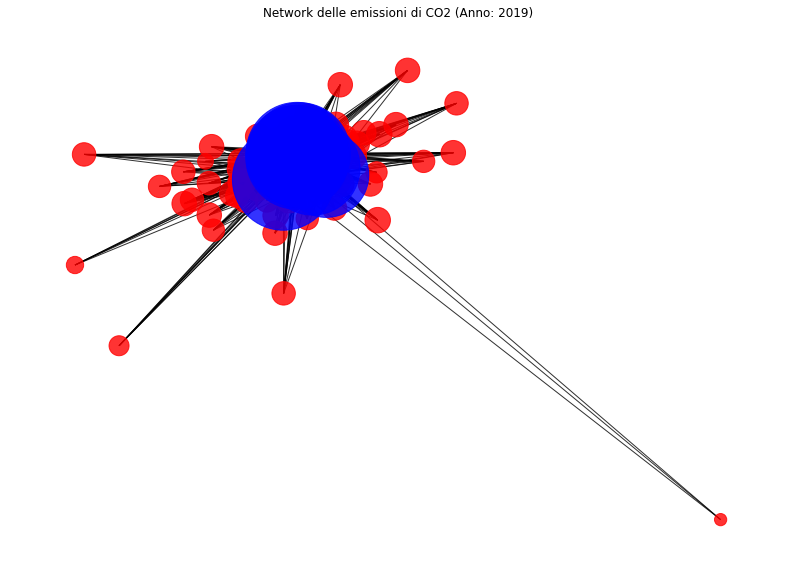

In [35]:
# Posizionamento
pos = nx.spring_layout(G, seed=42)

# Dimensione 
node_size = [v * 50 for v in dict(G.degree()).values()]

# Colori 
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Labels
node_labels = nx.get_node_attributes(G, "label")

# Peso degli archi
edge_weights = nx.get_edge_attributes(G, "weight")

# Creazione del plot del grafo
plt.figure(figsize=(14, 10))
nx.draw_networkx(G, pos, node_size=node_size, node_color=node_colors, with_labels=False, alpha=0.8)
#nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=10, font_weight="bold")
#nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_weights, font_size=8, font_color="red")

# Titolo del plot
plt.title("Network delle emissioni di CO2 (Anno: 2019)")

# Mostrare il plot del grafo
plt.axis("off")
plt.show()




In [7]:
nx.write_gexf(G, "CO2_emissions_bipartite_2019.gexf")

# Getting basic info

In [8]:
type(G)

networkx.classes.graph.Graph

In [7]:
print(nx.info(G))

Graph with 234 nodes and 3337 edges


In [39]:
G.edges(data=True)

EdgeDataView([('ABW', '1.A.1.a', {'weight': 647.687186508}), ('ABW', '1.A.2', {'weight': 114.99465917}), ('ABW', '1.A.3.a', {'weight': 6.416614272}), ('ABW', '1.A.3.b_noRES', {'weight': 416.8966303}), ('ABW', '1.A.3.d', {'weight': 13.81732146}), ('ABW', '1.A.3.e', {'weight': 17.80087151}), ('ABW', '1.A.4', {'weight': 162.828284053}), ('ABW', '1.A.5', {'weight': 17.909537959}), ('ABW', '2.A.3', {'weight': 0.005249377}), ('ABW', '2.A.4', {'weight': 3.86448e-05}), ('ABW', '2.D', {'weight': 6.348730226}), ('1.A.1.a', 'AFG', {'weight': 2456.4978578699997}), ('1.A.1.a', 'AGO', {'weight': 4612.129507}), ('1.A.1.a', 'AIA', {'weight': 1.032937933}), ('1.A.1.a', 'ANT', {'weight': 544.250969}), ('1.A.1.a', 'ARE', {'weight': 69861.14264}), ('1.A.1.a', 'ARG', {'weight': 43246.424510000004}), ('1.A.1.a', 'ARM', {'weight': 1353.361006}), ('1.A.1.a', 'ATG', {'weight': 392.784213422}), ('1.A.1.a', 'AUS', {'weight': 184451.105158}), ('1.A.1.a', 'AUT', {'weight': 20827.906562}), ('1.A.1.a', 'AZE', {'weig

In [40]:
#metadata - bipartite info
list(G.nodes(data=True))[0:5]

[('ABW',
  {'label': 'ABW',
   'color': 'red',
   'bipartite': 0,
   'part': 'accountCountries',
   'country_name': 'Aruba'}),
 ('1.A.1.a',
  {'label': '1.A.1.a',
   'color': 'blue',
   'bipartite': 1,
   'part': 'accountIndustries',
   'industry_name': 'Main Activity Electricity and Heat Production'}),
 ('AFG',
  {'label': 'AFG',
   'color': 'red',
   'bipartite': 0,
   'part': 'accountCountries',
   'country_name': 'Afghanistan'}),
 ('AGO',
  {'label': 'AGO',
   'color': 'red',
   'bipartite': 0,
   'part': 'accountCountries',
   'country_name': 'Angola'}),
 ('AIA',
  {'label': 'AIA',
   'color': 'red',
   'bipartite': 0,
   'part': 'accountCountries',
   'country_name': 'Anguilla'})]

In [10]:
from networkx.algorithms import bipartite
bottom_nodes, top_nodes = bipartite.sets(G)

# Measures to be applied

1. Density (cohesion)

2. Degree centrality
3. Betweeness centrality
4. Closeness Centrality
5. Laplacian centrality
6. Pagerank (Birank)

7. Jaccard's coefficient
8. simrank(?)

9. ?graph edit distance

# Visualizations

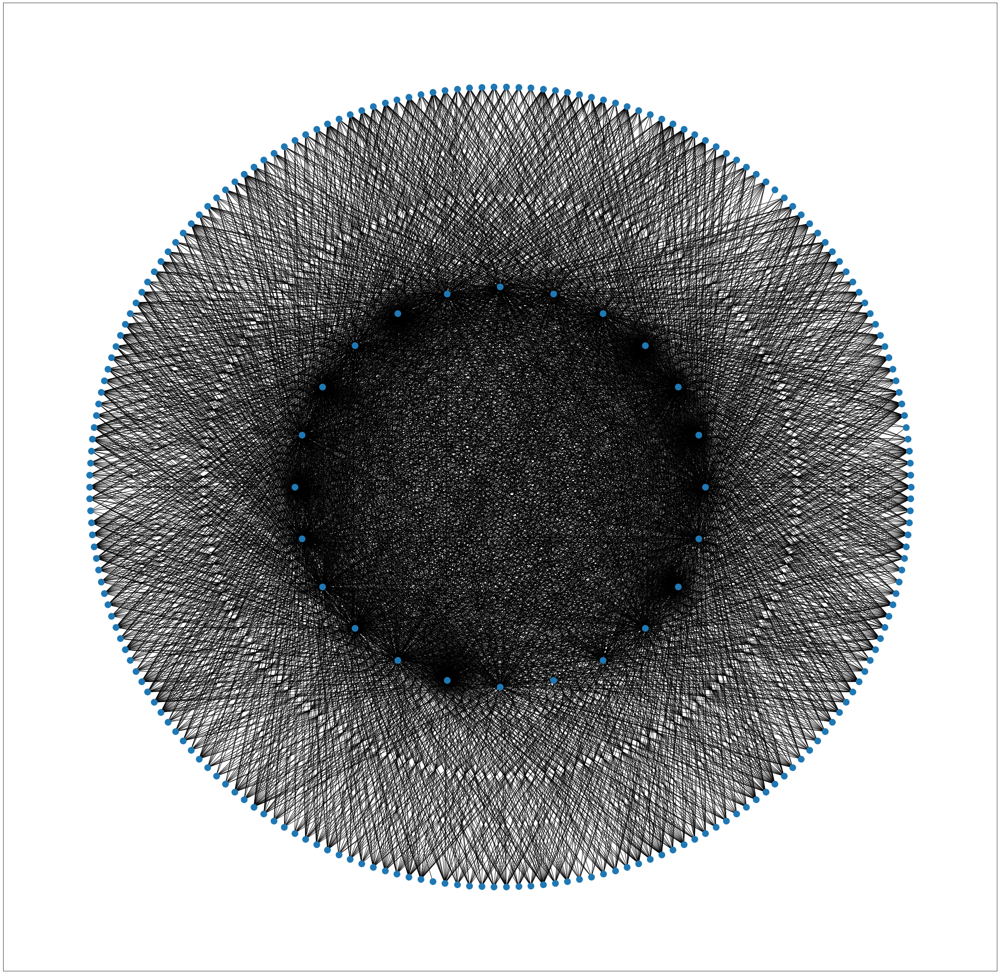

In [9]:
pos = nx.shell_layout(G, [top_nodes,bottom_nodes])
plt.figure(figsize=(40,40))
node_size=200
nx.draw_networkx(G, pos=pos, with_labels=False, node_size=node_size)

# Average weighted degree

In [11]:
weighted_deg=G.degree(nbunch=top_nodes, weight='weight')
w_series=pd.Series(dict(weighted_deg))
WDegNx=w_series.to_frame(name="nx_bipartite_weight_deg")
WDegNx.to_csv('../csv/weight_ind_deg2019.csv')
WDegNx.sort_values(by="nx_bipartite_weight_deg", ascending=False)

,nx_bipartite_weight_deg
1.A.1.a,1.481609e+07
1.A.2,8.203426e+06
1.A.3.b_noRES,6.336626e+06
1.A.4,6.214364e+06
1.A.1.bc,1.736853e+06
2.A.1,1.538812e+06
3.C.1,1.090839e+06
1.A.3.a,1.033981e+06
1.A.3.d,8.663550e+05
2.B,7.262029e+05


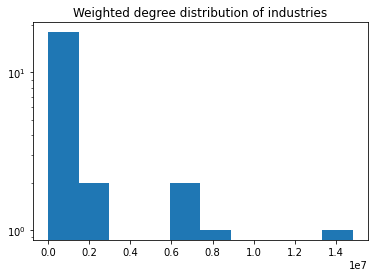

In [45]:
plt.hist(list(w_series))
plt.yscale('log')
plt.title('Weighted degree distribution of industries')
plt.show();


In [12]:
weighted_deg=G.degree(nbunch=bottom_nodes, weight='weight')
w_series=pd.Series(dict(weighted_deg))
CountryWDegNx=w_series.to_frame(name="nx_bipartite_weight_deg")
CountryWDegNx.to_csv('../csv/weight_country_deg2019.csv')
CountryWDegNx.sort_values(by="nx_bipartite_weight_deg", ascending=False)

,nx_bipartite_weight_deg
CHN,1.238974e+07
USA,5.647252e+06
IND,3.645444e+06
RUS,1.917831e+06
BRA,1.258196e+06
...,...
KIR,7.634846e+01
FLK,6.110663e+01
AIA,2.757999e+01
SHN,1.690945e+01


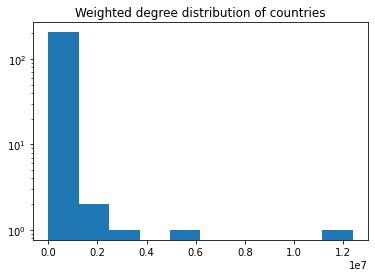

In [47]:
plt.hist(list(w_series))
plt.yscale('log')
plt.title('Weighted degree distribution of countries')
plt.show();

# Networkx's module bipartite

In [12]:
from networkx.algorithms import bipartite

bipartite.is_bipartite_node_set(G, top_nodes)

True

In [49]:
bipartite.is_bipartite_node_set(G, bottom_nodes)

True

## Cohesion

The term “cohesion” indicates the likelihood of nodes being connected to each 
other. Notably, cohesion (the measure) does not indicate social aggregation — 
e.g., in a “hate” network a hiG network cohesion implies less social cohesion.

### Density
The simplest measure of cohesion is density, i.e., the ratio between the number 
of ties in the network with respect to the total number of possible ties . 
While simple, density cohesion is not very useful as an absolute measure, e.g., in 
a 10-person network, a node is likely to have ties with all 9 others. On the 
contrary, in a 1000-person network it is much more unlikely that an actor has 
anything close to 999 ties with the rest of the members.
<br>
( To avoid the issue of comparing sensibly different networks over density alone, 
we can resort to a cohesion measure on the average degree of the network. This 
is obtained by calculating the average of the degrees (number of ties) of each 
node (i.e., the row sums of the adjacency matrix) )

In [50]:
print(round(bipartite.density(G, top_nodes), 2))

0.66


In [51]:
nx.number_connected_components(G) #?

1

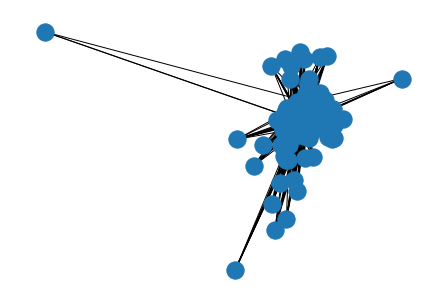

In [53]:
import matplotlib.pyplot as plt # import the dependent library
#The following line is a notebook magic command to draw figures ___inline___.

%matplotlib inline
#every time we run this, it'll show us a different layout

nx.draw(G)

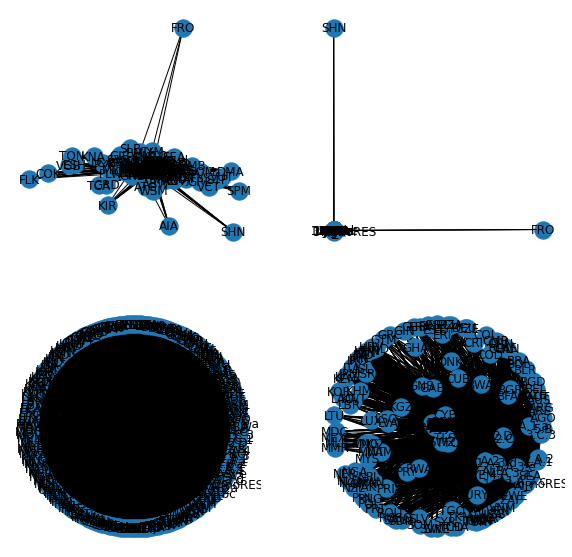

In [52]:
plt.figure(figsize=(10,10))
# plt.subplot() will create "sub-plots" in one canvas
# Now we are telling matplotlib to give us a 2x2 subplot canvas
plt.subplot(221)  # first subplot
nx.draw_spring(G, with_labels=True)
plt.subplot(222) # second subplot
nx.draw_spectral(G, with_labels=True)
plt.subplot(223) # third subplot
nx.draw_circular(G, with_labels=True)
plt.subplot(224) # last subplot
nx.draw_kamada_kawai(G, with_labels=True)


## Centrality
### Bipartite degree centrality
For unipartite networks, the degree centrality values are normalized by dividing by the maximum possible degree (which is n-1 where n is the number of nodes in G).

In the bipartite case, the maximum possible degree of a node in a bipartite node set is the number of nodes in the opposite node set [1]. The degree centrality for a node v in the bipartite sets U with n nodes and V with m nodes is
![degcentr](../img/degcentr.png)
 
 
 where deg(v) is the degree of node v.

In [16]:
bottom_nodes, top_nodes = bipartite.sets(G)
dcs = nx.bipartite.degree_centrality(G, bottom_nodes)

dcs_series=pd.Series(dcs)

BiDegCentrNx=dcs_series.to_frame(name="nx_bipartite_deg_centr")
BiDegCentrNx.sort_values(by="nx_bipartite_deg_centr", ascending=False)

,nx_bipartite_deg_centr
AUS,1.000000
USA,1.000000
CHN,1.000000
1.A.3.b_noRES,0.985714
2.A.3,0.985714
...,...
GIB,0.208333
FRO,0.125000
SEA,0.041667
AIR,0.041667


In [17]:
ind=dict()
country=dict()
for node in dcs:
    if node in top_nodes:        
        ind[node]=dcs[node]
    elif node in bottom_nodes:
        country[node]=dcs[node]

In [18]:
ind_series=pd.Series(ind)

IndBiDegCentrNx=ind_series.to_frame(name="nx_bipartite_deg_centr")
IndBiDegCentrNx.sort_values(by="nx_bipartite_deg_centr", ascending=False).head(n=10)

,nx_bipartite_deg_centr
2.A.3,0.985714
1.A.4,0.985714
1.A.3.b_noRES,0.985714
1.A.1.a,0.980952
1.A.2,0.980952
2.D,0.971429
3.C.1,0.890476
1.A.3.a,0.852381
2.A.1,0.761905
1.A.5,0.695238


In [19]:
series=pd.Series(country)

CountryBiDegCentrNx=series.to_frame(name="nx_bipartite_deg_centr")
CountryBiDegCentrNx.sort_values(by="nx_bipartite_deg_centr", ascending=False).head(n=10)

,nx_bipartite_deg_centr
AUS,1.000000
USA,1.000000
CHN,1.000000
POL,0.958333
IND,0.958333
HUN,0.958333
ITA,0.958333
ROU,0.958333
FRA,0.958333
CZE,0.958333


In [34]:
CountryBiDegCentrNx.to_csv("../csv/degree_centr_country2019.csv")
IndBiDegCentrNx.to_csv('../csv/degree_centr_ind2019.csv')

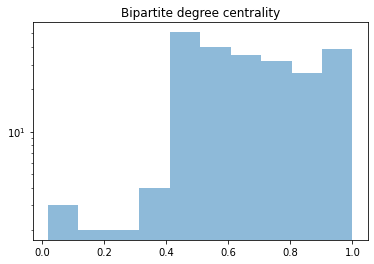

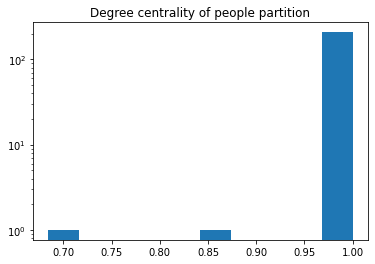

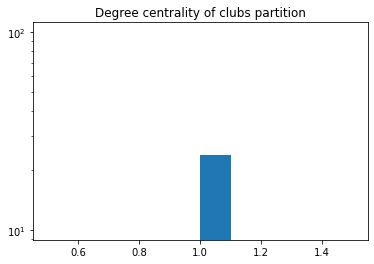

In [394]:
import matplotlib.pyplot as plt 

# Plot the degree centrality distribution of both node partitions from the original graph
plt.figure()
original_dc = nx.bipartite.degree_centrality(G, bottom_nodes)
plt.hist(list(original_dc.values()), alpha=0.5)
plt.yscale('log')
plt.title('Bipartite degree centrality')
plt.show();

# Plot the degree centrality distribution of the peopleG graph
plt.figure()  
people_dc = nx.degree_centrality(proj)
plt.hist(list(people_dc.values()))
plt.yscale('log')
plt.title('Degree centrality of people partition')
plt.show();

# Plot the degree centrality distribution of the clubsG graph
plt.figure() 
clubs_dc = nx.degree_centrality(weight_proj_ind)
plt.hist(list(clubs_dc.values()))
plt.yscale('log')
plt.title('Degree centrality of clubs partition')
plt.show();


### Bipartite betweeness

In [22]:
beetw = nx.bipartite.betweenness_centrality(G, bottom_nodes)
bet_series=pd.Series(beetw)
BetwCentrNx=bet_series.to_frame(name="nx_bipartite_betw_centr")
BetwCentrNx.sort_values(by="nx_bipartite_betw_centr", ascending=False)

,nx_bipartite_betw_centr
2.A.3,0.078872
1.A.3.b_noRES,0.075701
1.A.4,0.075701
1.A.1.a,0.074914
1.A.2,0.073808
...,...
AIA,0.000011
5.B,0.000010
FRO,0.000008
SEA,0.000000


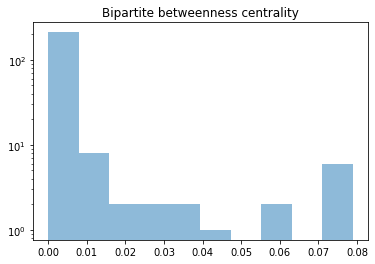

In [61]:
import matplotlib.pyplot as plt 

# Plot the degree centrality distribution of both node partitions from the original graph
plt.figure()
original_dc = nx.bipartite.betweenness_centrality(G, bottom_nodes)
plt.hist(list(original_dc.values()), alpha=0.5)
plt.yscale('log')
plt.title('Bipartite betweenness centrality')
plt.show();




In [23]:
ind=dict()
country=dict()
for node in beetw:
    if node in top_nodes:        
        ind[node]=beetw[node]
    elif node in bottom_nodes:
        country[node]=beetw[node]

In [27]:
ind_series=pd.Series(ind)

IndBetCentrNx=ind_series.to_frame(name="nx_bipartite_bet_centr")
IndBetCentrNx.to_csv('../csv/beetw_ind2019.csv')
IndBetCentrNx.sort_values(by="nx_bipartite_bet_centr", ascending=False).head(n=10)

,nx_bipartite_bet_centr
2.A.3,0.078872
1.A.3.b_noRES,0.075701
1.A.4,0.075701
1.A.1.a,0.074914
1.A.2,0.073808
2.D,0.071102
1.A.3.a,0.060928
3.C.1,0.059337
1.A.3.d,0.041320
2.A.1,0.038678


In [28]:
series=pd.Series(country)

CountryBiDegCentrNx=series.to_frame(name="nx_bipartite_bet_centr")
CountryBiDegCentrNx.to_csv('../csv/beetw_country2019.csv')
CountryBiDegCentrNx.sort_values(by="nx_bipartite_bet_centr", ascending=False).head(n=10)

,nx_bipartite_bet_centr
AUS,0.002974
USA,0.002974
CHN,0.002974
IND,0.002823
RUS,0.000755
ROU,0.000755
GRC,0.000755
FRA,0.000755
POL,0.000755
HUN,0.000755


### Closeness centrality

In [29]:
close = nx.bipartite.closeness_centrality(G, bottom_nodes)
cl_series=pd.Series(close)
CloseCentrNx=cl_series.to_frame(name="nx_bipartite_closen_centr")

CloseCentrNx.sort_values(by="nx_bipartite_closen_centr", ascending=False)

,nx_bipartite_closen_centr
AUS,1.000000
CHN,1.000000
USA,1.000000
FRA,0.995495
IND,0.995495
...,...
3.C.2,0.524590
2.A.2,0.522449
2.B,0.514056
1.B.1,0.503937


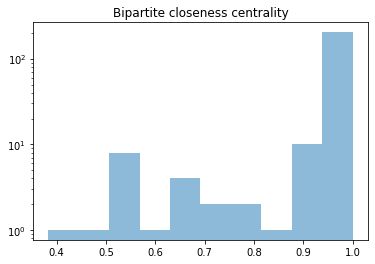

In [66]:
import matplotlib.pyplot as plt 

# Plot the degree centrality distribution of both node partitions from the original graph
plt.figure()
original_dc = nx.bipartite.closeness_centrality(G, bottom_nodes)
plt.hist(list(original_dc.values()), alpha=0.5)
plt.yscale('log')
plt.title('Bipartite closeness centrality')
plt.show();




In [30]:
ind=dict()
country=dict()
for node in close:
    if node in top_nodes:        
        ind[node]=close[node]
    elif node in bottom_nodes:
        country[node]=close[node]

In [33]:
ind_series=pd.Series(ind)

IndCentrNx=ind_series.to_frame(name="nx_bipartite_close_centr")
IndCentrNx.to_csv('../csv/close_ind2019.csv')
IndCentrNx.sort_values(by="nx_bipartite_close_centr", ascending=False).head(n=10)

,nx_bipartite_close_centr
2.A.3,0.977099
1.A.4,0.977099
1.A.3.b_noRES,0.977099
1.A.1.a,0.969697
1.A.2,0.969697
2.D,0.955224
3.C.1,0.847682
1.A.3.a,0.805031
2.A.1,0.719101
1.A.5,0.666667


In [35]:
series=pd.Series(country)

CountryBiDegCentrNx=series.to_frame(name="nx_bipartite_close_centr")
CountryBiDegCentrNx.to_csv('../csv/close_country2019.csv')
CountryBiDegCentrNx.sort_values(by="nx_bipartite_close_centr", ascending=False).head(n=10)

,nx_bipartite_close_centr
USA,1.000000
CHN,1.000000
AUS,1.000000
POL,0.995495
HUN,0.995495
CZE,0.995495
ROU,0.995495
IND,0.995495
GRC,0.995495
ITA,0.995495


In [ ]:
#CloseCentrNx.to_csv("../csv/closeness_nx.csv")

In [70]:
nx.bipartite.maximum_matching(G, top_nodes=top_nodes)           #????

{'1.A.1.a': 'ABW',
 '2.A.3': 'AFG',
 '1.A.5': 'AGO',
 '1.A.1.bc': 'ALB',
 '3.C.1': 'ARE',
 '2.A.4': 'ARG',
 '2.C': 'AUS',
 '1.A.2': 'AIA',
 '1.A.3.e': 'ATG',
 '1.A.4': 'ANT',
 '5.B': 'CHN',
 '1.A.3.a': 'AIR',
 '1.B.1': 'ARM',
 '2.A.2': 'AUT',
 '1.B.2': 'AZE',
 '1.A.3.b_noRES': 'BDI',
 '2.B': 'BEL',
 '4.C': 'BEN',
 '1.A.3.d': 'BFA',
 '1.A.3.c': 'BGD',
 '3.C.2': 'BGR',
 '2.A.1': 'BHR',
 '2.D': 'BHS',
 '3.C.3': 'BIH',
 'CHN': '5.B',
 'ATG': '1.A.3.e',
 'AIR': '1.A.3.a',
 'ANT': '1.A.4',
 'ARG': '2.A.4',
 'ABW': '1.A.1.a',
 'AUT': '2.A.2',
 'BFA': '1.A.3.d',
 'AIA': '1.A.2',
 'BGR': '3.C.2',
 'AUS': '2.C',
 'AFG': '2.A.3',
 'BEL': '2.B',
 'BDI': '1.A.3.b_noRES',
 'BEN': '4.C',
 'BIH': '3.C.3',
 'AZE': '1.B.2',
 'BHS': '2.D',
 'ARM': '1.B.1',
 'ALB': '1.A.1.bc',
 'AGO': '1.A.5',
 'BGD': '1.A.3.c',
 'BHR': '2.A.1',
 'ARE': '3.C.1'}

# Laplacian

In [36]:
"""
Laplacian centrality measures.
"""
import networkx as nx

__all__ = ["laplacian_centrality"]


def laplacian_centrality(
    G, normalized=True, nodelist=None, weight="weight", walk_type=None, alpha=0.95
):
    r"""Compute the Laplacian centrality for nodes in the graph `G`.

    The Laplacian Centrality of a node ``i`` is measured by the drop in the
    Laplacian Energy after deleting node ``i`` from the graph. The Laplacian Energy
    is the sum of the squared eigenvalues of a graph's Laplacian matrix.

    .. math::

        C_L(u_i,G) = \frac{(\Delta E)_i}{E_L (G)} = \frac{E_L (G)-E_L (G_i)}{E_L (G)}

        E_L (G) = \sum_{i=0}^n \lambda_i^2

    Where $E_L (G)$ is the Laplacian energy of graph `G`,
    E_L (G_i) is the Laplacian energy of graph `G` after deleting node ``i``
    and $\lambda_i$ are the eigenvalues of `G`'s Laplacian matrix.
    This formula shows the normalized value. Without normalization,
    the numerator on the right side is returned.

    Parameters
    ----------
    G : graph
        A networkx graph

    normalized : bool (default = True)
        If True the centrality score is scaled so the sum over all nodes is 1.
        If False the centrality score for each node is the drop in Laplacian
        energy when that node is removed.

    nodelist : list, optional (default = None)
        The rows and columns are ordered according to the nodes in nodelist.
        If nodelist is None, then the ordering is produced by G.nodes().

    weight: string or None, optional (default=`weight`)
        Optional parameter `weight` to compute the Laplacian matrix.
        The edge data key used to compute each value in the matrix.
        If None, then each edge has weight 1.

    walk_type : string or None, optional (default=None)
        Optional parameter `walk_type` used when calling
        :func:`directed_laplacian_matrix <networkx.directed_laplacian_matrix>`.
        If None, the transition matrix is selected depending on the properties
        of the graph. Otherwise can be `random`, `lazy`, or `pagerank`.

    alpha : real (default = 0.95)
        Optional parameter `alpha` used when calling
        :func:`directed_laplacian_matrix <networkx.directed_laplacian_matrix>`.
        (1 - alpha) is the teleportation probability used with pagerank.

    Returns
    -------
    nodes : dictionary
       Dictionary of nodes with Laplacian centrality as the value.

    Examples
    --------
    >>> G = nx.Graph()
    >>> edges = [(0, 1, 4), (0, 2, 2), (2, 1, 1), (1, 3, 2), (1, 4, 2), (4, 5, 1)]
    >>> G.add_weighted_edges_from(edges)
    >>> sorted((v, f"{c:0.2f}") for v, c in laplacian_centrality(G).items())
    [(0, '0.70'), (1, '0.90'), (2, '0.28'), (3, '0.22'), (4, '0.26'), (5, '0.04')]

    Notes
    -----
    The algorithm is implemented based on [1]_ with an extension to directed graphs
    using the ``directed_laplacian_matrix`` function.

    Raises
    ------
    NetworkXPointlessConcept
        If the graph `G` is the null graph.

    References
    ----------
    .. [1] Qi, X., Fuller, E., Wu, Q., Wu, Y., and Zhang, C.-Q. (2012).
       Laplacian centrality: A new centrality measure for weighted networks.
       Information Sciences, 194:240-253.
       https://math.wvu.edu/~cqzhang/Publication-files/my-paper/INS-2012-Laplacian-W.pdf

    See Also
    --------
    directed_laplacian_matrix
    laplacian_matrix
    """
    import numpy as np
    import scipy as sp
    import scipy.linalg  # call as sp.linalg

    if len(G) == 0:
        raise nx.NetworkXPointlessConcept("null graph has no centrality defined")

    if nodelist != None:
        nodeset = set(G.nbunch_iter(nodelist))
        if len(nodeset) != len(nodelist):
            raise nx.NetworkXError("nodelist has duplicate nodes or nodes not in G")
        nodes = nodelist + [n for n in G if n not in nodeset]
    else:
        nodelist = nodes = list(G)

    if G.is_directed():
        lap_matrix = nx.directed_laplacian_matrix(G, nodes, weight, walk_type, alpha)
    else:
        lap_matrix = nx.laplacian_matrix(G, nodes, weight).toarray()

    full_energy = np.power(sp.linalg.eigh(lap_matrix, eigvals_only=True), 2).sum()

    # calculate laplacian centrality
    laplace_centralities_dict = {}
    for i, node in enumerate(nodelist):
        # remove row and col i from lap_matrix
        all_but_i = list(np.arange(lap_matrix.shape[0]))
        all_but_i.remove(i)
        A_2 = lap_matrix[all_but_i, :][:, all_but_i]

        # Adjust diagonal for removed row
        new_diag = lap_matrix.diagonal() - abs(lap_matrix[:, i])
        np.fill_diagonal(A_2, new_diag[all_but_i])

        new_energy = np.power(sp.linalg.eigh(A_2, eigvals_only=True), 2).sum()
        lapl_cent = full_energy - new_energy
        if normalized:
            lapl_cent = lapl_cent / full_energy

        laplace_centralities_dict[node] = lapl_cent

    return laplace_centralities_dict 

In [ ]:
#laplacian_centrality(G, weight="weight")

['1.A.1.a', 'CHN', '1.A.2', 'USA', '1.A.3.b_noRES']

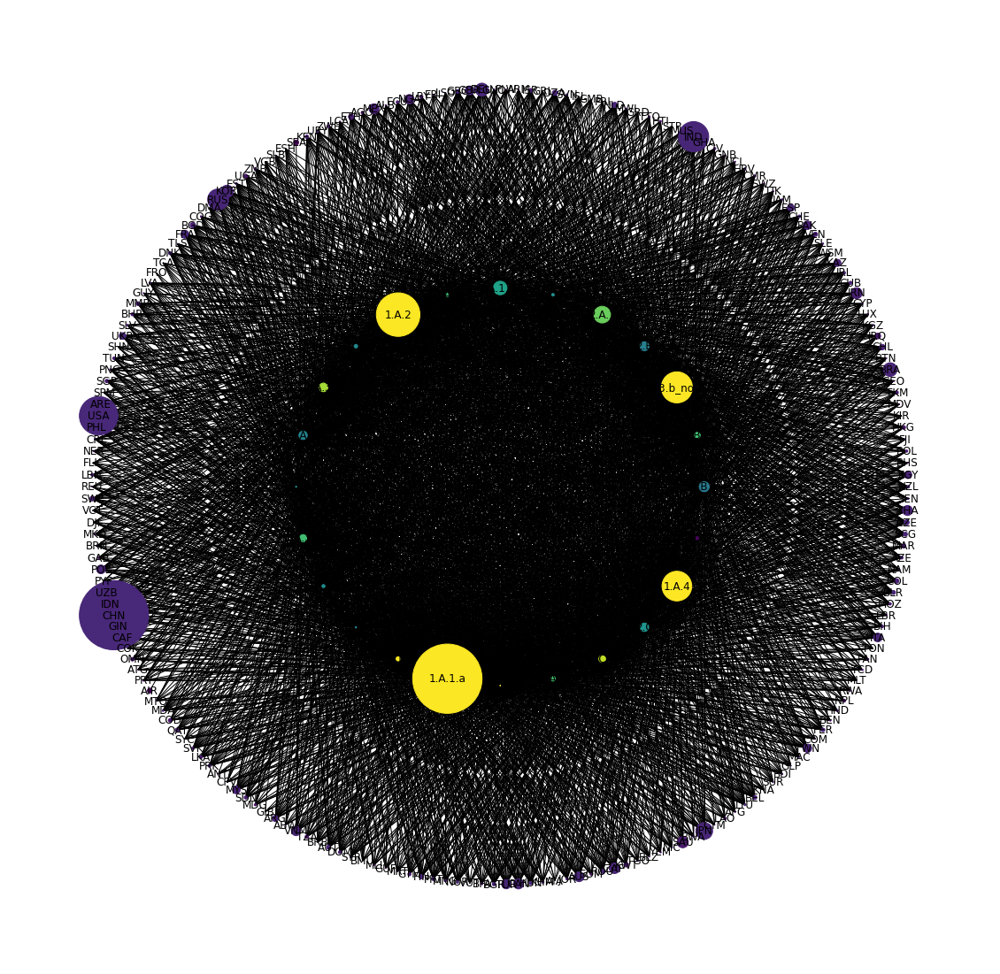

In [73]:
LaplCentr=laplacian_centrality(G, weight='weight')
node_color = [20000.0 * G.degree(v) for v in G]
node_size = [v * 10000 for v in LaplCentr.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=True,
node_color=node_color,
node_size=node_size)
plt.axis('off')
sorted(LaplCentr, key=LaplCentr.get, reverse=True)[:5]

In [37]:
ind_lapl=laplacian_centrality(G, nodelist=list(top_nodes),weight="weight")
lapl_series=pd.Series(ind_lapl)
LaplCentrNxInd=lapl_series.to_frame(name="nx_lapl_centr_ind")
LaplCentrNxInd.to_csv('../csv/lapl_ind2019.csv')
LaplCentrNxInd.sort_values(by="nx_lapl_centr_ind", ascending=False).head(n=10)

,nx_lapl_centr_ind
1.A.1.a,0.613052
1.A.2,0.242057
1.A.3.b_noRES,0.123287
1.A.4,0.112655
2.A.1,0.035488
1.A.1.bc,0.023653
1.B.1,0.012847
2.B,0.010227
1.A.3.a,0.009528
2.C,0.009050


In [38]:
countryLapl=laplacian_centrality(G, nodelist=list(bottom_nodes),weight="weight")
lapl_series=pd.Series(countryLapl)
LaplCentrNx=lapl_series.to_frame(name="nx_lapl_centr_country")
LaplCentrNx.to_csv('../csv/lapl_country_2019.csv')
LaplCentrNx.sort_values(by="nx_lapl_centr_country", ascending=False).head(n=10)

,nx_lapl_centr_country
CHN,0.612277
USA,0.189434
IND,0.116881
RUS,0.055996
JPN,0.036020
BRA,0.024103
DEU,0.021632
IDN,0.021450
KOR,0.019545
SAU,0.015745


## Byrank measures
Bipartite (two-mode) networks are ubiquitous. When calculating node centrality measures in bipartite networks, a common approach is to apply PageRank on the one-mode projection of the network. However, the projection can cause information loss and distort the network topology. For better node ranking on bipartite networks, it is preferable to use a ranking algorithm that fully accounts for the topology of both modes of the network.

BiRank package implements bipartite ranking algorithms HITS, CoHITS, BGRM, and BiRank. BiRank provides convenience options for incorporating node-level weights into rank estimations, allowing maximum flexibility for different purpose. It can efficiently handle networks with millions of nodes on a single midrange server. Both R and Python versions are available.

![birank](../img/illustration.png) <br><br>

In [39]:
%pip install birankpy

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


In [77]:
df_grouped

,ipcc_code_2006_for_standard_report,Country_code_A3,Name,ipcc_code_2006_for_standard_report_name,Y_2019
0,1.A.1.a,ABW,Aruba,Main Activity Electricity and Heat Production,647.687187
1,1.A.1.a,AFG,Afghanistan,Main Activity Electricity and Heat Production,2456.497858
2,1.A.1.a,AGO,Angola,Main Activity Electricity and Heat Production,4612.129507
3,1.A.1.a,AIA,Anguilla,Main Activity Electricity and Heat Production,1.032938
4,1.A.1.a,ANT,Netherlands Antilles,Main Activity Electricity and Heat Production,544.250969
...,...,...,...,...,...
3332,4.C,VNM,Viet Nam,Incineration and Open Burning of Waste,46.580609
3333,5.B,AUS,Australia,Fossil fuel fires,189.200000
3334,5.B,CHN,China,Fossil fuel fires,28380.000000
3335,5.B,IND,India,Fossil fuel fires,14190.000000


In [40]:
import birankpy
bn = birankpy.BipartiteNetwork()

bn.set_edgelist(df_grouped,  top_col='ipcc_code_2006_for_standard_report', bottom_col='Country_code_A3', weight_col='Y_2019')


Now we can try the BiRank algorithm with different normalizers:

In [41]:
HITSdf, _ = bn.generate_birank(normalizer='HITS')
HITSdf.to_csv('../csv/hits_ind2019.csv')
HITSdf.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
0,1.A.1.a,0.410006
2,1.A.2,0.217139
4,1.A.3.b_noRES,0.092126
8,1.A.4,0.085620
12,2.A.1,0.053040


In [42]:
br_df, _ = bn.generate_birank(normalizer='BiRank')
br_df.to_csv('../csv/birank_ind2019.csv')
br_df.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
0,1.A.1.a,0.048331
2,1.A.2,0.037753
8,1.A.4,0.034857
4,1.A.3.b_noRES,0.034653
1,1.A.1.bc,0.021009


### Countries

In [43]:
import birankpy
countryfirst_bn = birankpy.BipartiteNetwork()

countryfirst_bn.set_edgelist(noNa, top_col='Country_code_A3', bottom_col='ipcc_code_2006_for_standard_report',  weight_col='Y_2019')

In [44]:
HITSdf, _ = countryfirst_bn.generate_birank(normalizer='HITS')
HITSdf.to_csv('../csv/hits_country2019.csv')
HITSdf.sort_values(by='Country_code_A3_birank', ascending=False).head()

,Country_code_A3,Country_code_A3_birank
36,CHN,0.333167
198,USA,0.118201
90,IND,0.088528
160,RUS,0.047701
99,JPN,0.031956


In [45]:
birankdf, _ = countryfirst_bn.generate_birank(normalizer='BiRank')
birankdf.to_csv('../csv/birank_country2019.csv')
birankdf.sort_values(by='Country_code_A3_birank', ascending=False).head()

,Country_code_A3,Country_code_A3_birank
36,CHN,0.043130
198,USA,0.029843
90,IND,0.023633
160,RUS,0.018158
165,SEA,0.016480


### Unipartite Projection
Another way of performing PageRank on bipartite networks is first to convert the networks to unipartite counterpats through projection, then apply PageRank. This can also be done with our package.

First, project the network on to the characters:

In [46]:
country_un = countryfirst_bn.unipartite_projection(on='Country_code_A3')
country_projected_pagerank_df = country_un.generate_pagerank()
country_projected_pagerank_df.to_csv('../csv/pagerank_country2019.csv')
country_projected_pagerank_df.sort_values(by='pagerank', ascending=False).head()

,Country_code_A3,pagerank
36,CHN,0.204857
198,USA,0.107397
90,IND,0.077806
160,RUS,0.042837
99,JPN,0.029829


In [47]:
un = bn.unipartite_projection(on='ipcc_code_2006_for_standard_report_birank')
projected_pagerank_df = un.generate_pagerank()
projected_pagerank_df.to_csv('../csv/pagerank_ind2019.csv')
projected_pagerank_df.sort_values(by='pagerank', ascending=False).head()

,ipcc_code_2006_for_standard_report,pagerank
0,1.A.1.a,0.280240
2,1.A.2,0.193115
4,1.A.3.b_noRES,0.100894
8,1.A.4,0.094550
12,2.A.1,0.058349


# Projection

In [20]:
proj = bipartite.projected_graph(G, bottom_nodes)
weight_proj_B = bipartite.weighted_projected_graph(G, bottom_nodes)
#weight_proj_B.edges(data=True)

In [21]:
proj_ind= bipartite.projected_graph(G, top_nodes)
weight_proj_I = bipartite.weighted_projected_graph(G, top_nodes)
#weight_proj_I.edges(data=True)

In [57]:
print(proj, proj_ind)

Graph with 210 nodes and 21849 edges Graph with 24 nodes and 276 edges


In [148]:
print('Avg. clustering coefficient:', nx.average_clustering(weight_proj_B))
print('Avg. clustering coefficient:', nx.average_clustering(weight_proj_I))

Avg. clustering coefficient: 0.9967603334880185
Avg. clustering coefficient: 1.0


In [149]:
print('Assortativity', nx.degree_assortativity_coefficient(weight_proj_B))

Assortativity -0.019203389073828576


In [60]:
print('Assortativity', nx.degree_assortativity_coefficient(G))

Assortativity -0.8404714418935154


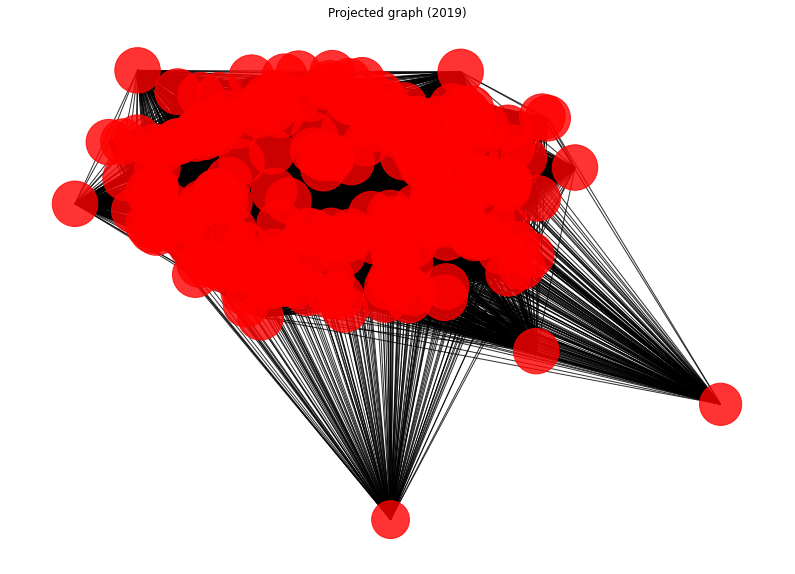

In [152]:
# Posizionamento dei nodi nel plot del grafo
pos = nx.spring_layout(weight_proj_B, seed=42)

# Dimensione dei nodi proporzionale al grado
node_size = [v * 10 for v in dict(weight_proj_B.degree()).values()]

# Colori dei nodi
node_colors = [data["color"] for _, data in weight_proj_B.nodes(data=True)]

# Etichette dei nodi
node_labels = nx.get_node_attributes(weight_proj_B, "label")

# Peso degli archi
edge_weights = nx.get_edge_attributes(weight_proj_B, "weight")

# Creazione del plot del grafo
plt.figure(figsize=(14, 10))
nx.draw_networkx(weight_proj_B, pos, node_size=node_size, node_color=node_colors, with_labels=False, alpha=0.8)
#nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=10, font_weight="bold")
#nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_weights, font_size=8, font_color="red")

# Titolo del plot
plt.title("Projected graph (2019)")

# Mostrare il plot del grafo
plt.axis("off")
plt.show()

In [153]:
print(weight_proj_B)

Graph with 210 nodes and 21849 edges


In [19]:
#weight_proj_B.degree()

In [18]:

#list(weight_proj_I.edges(data=True))

In [156]:
print(weight_proj_I)

Graph with 24 nodes and 276 edges


# Periphery

In [68]:
nx.periphery(G)

#Returns the periphery of the graph G.

#The periphery is the set of nodes with eccentricity equal to the diameter.

['AIA',
 'ANT',
 'ARE',
 'ARM',
 'BEN',
 'BGD',
 'BGR',
 'BHR',
 'BIH',
 'BOL',
 'BRN',
 'BWA',
 'CMR',
 'CUB',
 'DOM',
 'ERI',
 'ETH',
 'GAB',
 'GIB',
 'GNQ',
 'GTM',
 'GUY',
 'HKG',
 'HND',
 'HTI',
 'IRN',
 'IRQ',
 'ISR',
 'JOR',
 'KAZ',
 'KGZ',
 'KWT',
 'LAO',
 'LBN',
 'LBY',
 'LUX',
 'MAR',
 'MDA',
 'MKD',
 'MNG',
 'NER',
 'NPL',
 'OMN',
 'PAK',
 'PAN',
 'PRI',
 'PRK',
 'PRY',
 'QAT',
 'SAU',
 'SCG',
 'SGP',
 'SHN',
 'SLV',
 'SUR',
 'SVK',
 'SVN',
 'SYR',
 'TGO',
 'TJK',
 'TKM',
 'TTO',
 'TUN',
 'TZA',
 'UZB',
 'VEN',
 'YEM',
 'ZMB',
 'ZWE',
 'ALB',
 'AIR',
 'SEA',
 'FRO']

In [52]:
len(nx.periphery(G))

73

In [157]:
len(nx.periphery(weight_proj_B))

73

# Cores

In [ ]:
nx.core_number(G)

In [71]:
core_g=nx.k_core(G)
print(core_g)

Graph with 56 nodes and 739 edges


In [72]:
dc = nx.degree(proj)
dcv = [ v for k, v in dc]
max(dcv)

209

In [73]:
k = 209
while True:
  kg = nx.k_core(proj, k)
  if kg.number_of_nodes() > 0:
    break
  else:
    k = k -1

In [74]:
print("Largest core in countries graph is {} ".format(k))

Largest core in countries graph is 207 


Observation:
We can find a group of countries where each one is similar to 207 countries in terms of industrial activity.

# Assortativity

In [75]:
nx.degree_pearson_correlation_coefficient(G, weight='weight')

-0.14864028033273988

In [131]:
nx.degree_pearson_correlation_coefficient(weight_proj_B, weight='weight')

-0.014094581139618043

In [109]:
nx.degree_assortativity_coefficient(G, weight='weight')

-0.14864028033274015

degree distrib

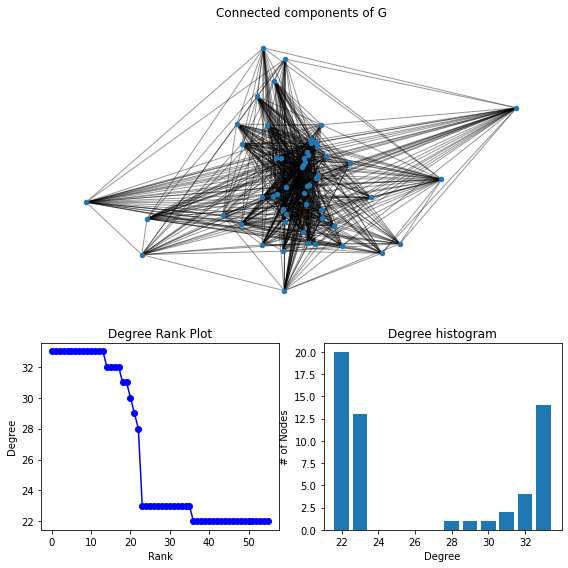

In [111]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

degree_sequence = sorted((d for n, d in core_g.degree()), reverse=True)
dmax = max(degree_sequence)

fig = plt.figure("Degree of a random graph", figsize=(8, 8))
# Create a gridspec for adding subplots of different sizes
axgrid = fig.add_gridspec(5, 4)

ax0 = fig.add_subplot(axgrid[0:3, :])
Gcc = core_g.subgraph(sorted(nx.connected_components(core_g), key=len, reverse=True)[0])
pos = nx.spring_layout(Gcc, seed=10396953)
nx.draw_networkx_nodes(Gcc, pos, ax=ax0, node_size=20)
nx.draw_networkx_edges(Gcc, pos, ax=ax0, alpha=0.4)
ax0.set_title("Connected components of G")
ax0.set_axis_off()

ax1 = fig.add_subplot(axgrid[3:, :2])
ax1.plot(degree_sequence, "b-", marker="o")
ax1.set_title("Degree Rank Plot")
ax1.set_ylabel("Degree")
ax1.set_xlabel("Rank")

ax2 = fig.add_subplot(axgrid[3:, 2:])
ax2.bar(*np.unique(degree_sequence, return_counts=True))
ax2.set_title("Degree histogram")
ax2.set_xlabel("Degree")
ax2.set_ylabel("# of Nodes")

fig.tight_layout()
plt.show()

In [112]:
core_g.degree()

DegreeView({'BGR': 22, 'TUR': 22, 'CAN': 22, 'DEU': 23, 'HUN': 23, 'GBR': 22, 'AUS': 23, '1.A.1.bc': 33, 'GRC': 23, 'ROU': 23, 'BRA': 22, 'ZAF': 22, '1.A.2': 33, '1.A.3.e': 29, '2.A.4': 32, 'POL': 23, '1.A.3.a': 33, 'CHN': 23, '2.A.2': 33, '4.C': 31, '1.A.3.c': 33, 'JPN': 22, '1.A.3.d': 32, '3.C.2': 32, 'LTU': 22, 'BEL': 22, '2.D': 33, 'CHE': 22, 'TWN': 22, 'ESP': 22, 'KOR': 22, '1.A.1.a': 33, 'RUS': 23, '2.A.3': 33, '1.A.5': 28, 'FRA': 23, 'ITA': 23, 'IND': 22, 'DNK': 22, '2.C': 32, '1.A.4': 33, 'BLR': 22, '3.C.1': 33, '1.B.1': 30, 'UKR': 23, '1.A.3.b_noRES': 33, '1.B.2': 33, '2.B': 33, 'AUT': 22, 'DZA': 22, '2.A.1': 33, 'CZE': 23, 'USA': 23, '3.C.3': 31, 'FIN': 22, 'NOR': 22})

Largest eigenvalue: (1.9999999999999998+0j)
Smallest eigenvalue: (4.440892098500626e-16+0j)


C:\Users\lored\AppData\Roaming\Python\Python310\site-packages\numpy\lib\histograms.py:852: ComplexWarning: Casting complex values to real discards the imaginary part
  indices = f_indices.astype(np.intp)
C:\Users\lored\AppData\Roaming\Python\Python310\site-packages\matplotlib\transforms.py:775: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.asarray(points, float)


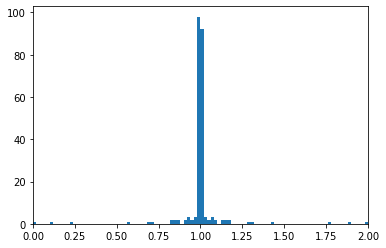

In [113]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy.linalg



L = nx.normalized_laplacian_matrix(G)
e = numpy.linalg.eigvals(L.toarray())
print("Largest eigenvalue:", max(e))
print("Smallest eigenvalue:", min(e))
plt.hist(e, bins=100)  # histogram with 100 bins
plt.xlim(0, 2)  # eigenvalues between 0 and 2
plt.show()

# Simrank 

In [77]:
sr19= nx.simrank_similarity(G)
sr19Data = pd.DataFrame(data=sr19)
sr19Data

,ABW,1.A.1.a,AFG,AGO,AIA,ANT,ARE,ARG,ARM,ATG,...,FRO,2.A.4,2.B,2.C,2.D,3.C.1,3.C.2,3.C.3,4.C,5.B
ABW,1.000000,0.000000,0.547373,0.535282,0.602662,0.599886,0.588063,0.540125,0.574456,0.614338,...,0.474885,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1.A.1.a,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.561587,0.560472,0.605677,0.542582,0.507012,0.511075,0.544456,0.540496,0.614945
AFG,0.547373,0.000000,1.000000,0.532518,0.525654,0.546196,0.557853,0.534703,0.538570,0.547112,...,0.469176,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AGO,0.535282,0.000000,0.532518,1.000000,0.533737,0.532408,0.510389,0.528118,0.564385,0.535127,...,0.465542,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AIA,0.602662,0.000000,0.525654,0.533737,1.000000,0.677174,0.561016,0.545309,0.599942,0.603923,...,0.469427,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3.C.1,0.000000,0.507012,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.501211,0.502657,0.505869,0.500590,1.000000,0.517732,0.520968,0.498317,0.520445
3.C.2,0.000000,0.511075,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.508495,0.507011,0.513133,0.507496,0.517732,1.000000,0.511764,0.504036,0.516701
3.C.3,0.000000,0.544456,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.528919,0.533023,0.554141,0.520871,0.520968,0.511764,1.000000,0.517443,0.584359
4.C,0.000000,0.540496,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.539278,0.530811,0.553784,0.521008,0.498317,0.504036,0.517443,1.000000,0.549498


In [132]:
sr19p= nx.simrank_similarity(weight_proj_B)
sr19Datap = pd.DataFrame(data=sr19p)
sr19Datap

,KGZ,SEN,GIB,CHL,DOM,GRC,NZL,PRK,FJI,BRB,...,SYR,TKM,ZAF,LCA,CRI,ESP,SCG,ATG,SUR,HTI
KGZ,1.000000,0.042195,0.042078,0.042284,0.042249,0.042272,0.042290,0.042273,0.042123,0.042148,...,0.042259,0.042248,0.042269,0.042099,0.042224,0.042259,0.042301,0.042085,0.042180,0.042185
SEN,0.042195,1.000000,0.042064,0.042222,0.042195,0.042213,0.042225,0.042211,0.042103,0.042121,...,0.042200,0.042196,0.042211,0.042086,0.042175,0.042203,0.042234,0.042076,0.042144,0.042148
GIB,0.042078,0.042064,1.000000,0.042096,0.042088,0.042093,0.042097,0.042095,0.042048,0.042054,...,0.042080,0.042081,0.042088,0.042052,0.042073,0.042090,0.042103,0.042038,0.042076,0.042065
CHL,0.042284,0.042222,0.042096,1.000000,0.042291,0.042318,0.042337,0.042320,0.042140,0.042169,...,0.042297,0.042289,0.042313,0.042116,0.042256,0.042303,0.042351,0.042096,0.042210,0.042213
DOM,0.042249,0.042195,0.042088,0.042291,1.000000,0.042276,0.042296,0.042279,0.042122,0.042147,...,0.042259,0.042252,0.042272,0.042101,0.042225,0.042263,0.042308,0.042083,0.042187,0.042189
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ESP,0.042259,0.042203,0.042090,0.042303,0.042263,0.042289,0.042306,0.042289,0.042131,0.042157,...,0.042270,0.042260,0.042285,0.042111,0.042234,1.000000,0.042319,0.042094,0.042191,0.042194
SCG,0.042301,0.042234,0.042103,0.042351,0.042308,0.042335,0.042356,0.042337,0.042145,0.042176,...,0.042315,0.042303,0.042329,0.042120,0.042270,0.042319,1.000000,0.042098,0.042222,0.042224
ATG,0.042085,0.042076,0.042038,0.042096,0.042083,0.042097,0.042094,0.042085,0.042073,0.042075,...,0.042080,0.042081,0.042097,0.042075,0.042082,0.042094,0.042098,1.000000,0.042065,0.042063
SUR,0.042180,0.042144,0.042076,0.042210,0.042187,0.042200,0.042213,0.042204,0.042094,0.042113,...,0.042189,0.042186,0.042196,0.042079,0.042163,0.042191,0.042222,0.042065,1.000000,0.042147


In [80]:
#max(sr19['CHN'], key=sr19['CHN'].get)

In [133]:
def get_top_similar_countries(simrank_result):
    keys_to_remove = []
    
    # Iterate over the keys (nodes) in sr19['CHN']
    for c in simrank_result:
        if simrank_result[c] == 1:
            keys_to_remove.append(c)

    # Remove the keys from the dictionary
    for key in keys_to_remove:
        del simrank_result[key]

    sorted_countries = sorted(simrank_result.items(), key=lambda x: x[1], reverse=True)
    top_n = 5
    #most_similar_countries = sorted_countries[:top_n]
    #for country, simrank_score in most_similar_countries:
        #print(f"{country}: {simrank_score}")
    # Select the top N similar countries
    top_similar = sorted_countries[:top_n]
    
    # Create a Pandas Series with index as country names and values as SimRank scores
    similar_series = pd.Series({country: score for country, score in top_similar})
    
    return similar_series

In [134]:
get_top_similar_countries(sr19['CHN'])

HKG    0.631589
BHR    0.619851
TWN    0.615149
MNG    0.613815
MUS    0.612868
dtype: float64

In [83]:
import pandas as pd

# Your original DataFrame (replace this with your actual DataFrame)
your_original_df = pd.DataFrame({
 #'CHN':[], 'USA':[], 'RUS':[],'JPN':[], 'IND':[],
    # Other columns in your DataFrame
})
your_original_df
# Example usage for reference country 'CHN'
Ind = get_top_similar_countries(sr19['RUS'])
chi= get_top_similar_countries(sr19['CHN'])
indi= get_top_similar_countries(sr19['IND'])
jpn= get_top_similar_countries(sr19['JPN'])
usa= get_top_similar_countries(sr19['USA'])
# Join the 'Ind' Series with your original DataFrame
result_df = pd.concat([your_original_df, Ind.rename('RUS')], axis=1)
result_df = pd.concat([result_df, chi.rename('CHN')], axis=1)
result_df = pd.concat([result_df, indi.rename('IND')], axis=1)
result_df = pd.concat([result_df, usa.rename('USA')], axis=1)

# Print the resulting DataFrame
result_df=result_df.fillna('-')
result_df.to_csv('../csv/simrank_top_similar2019.csv')
print(result_df)


          RUS       CHN       IND       USA
HKG  0.623533  0.631589  0.603594  0.599656
BHR  0.610059  0.619851  0.591555         -
SCG  0.605505         -  0.592161         -
TWN  0.605006  0.615149         -         -
MNG  0.604134  0.613815  0.591769         -
MUS         -  0.612868  0.592366         -
SHN         -         -         -  0.598877
GIB         -         -         -  0.596991
LBN         -         -         -  0.591454
AIA         -         -         -  0.591143


In [85]:
import itertools

# List of 5 strings
strings = ["CHN",'USA','JPN','RUS','IND']

# Generate all possible tuples of 2 strings
string_combinations = list(itertools.combinations(strings, 2))
for couple in string_combinations:
 print(couple,nx.simrank_similarity(G,couple[0],couple[1]) )

('CHN', 'USA') 0.5638340682218227
('CHN', 'JPN') 0.5965104779925744
('CHN', 'RUS') 0.5899093224341493
('CHN', 'IND') 0.5880975081990886
('USA', 'JPN') 0.5701262803473327
('USA', 'RUS') 0.5607612396759586
('USA', 'IND') 0.5563114556850906
('JPN', 'RUS') 0.5868163425612133
('JPN', 'IND') 0.5819124933599255
('RUS', 'IND') 0.5763006895023939


In [135]:
import pandas as pd

# Your original DataFrame (replace this with your actual DataFrame)
your_original_df = pd.DataFrame({
 #'CHN':[], 'USA':[], 'RUS':[],'JPN':[], 'IND':[],
    # Other columns in your DataFrame
})
your_original_df
# Example usage for reference country 'CHN'
Ind = get_top_similar_countries(sr19p['RUS'])
chi= get_top_similar_countries(sr19p['CHN'])
indi= get_top_similar_countries(sr19p['IND'])
jpn= get_top_similar_countries(sr19p['JPN'])
usa= get_top_similar_countries(sr19p['USA'])
# Join the 'Ind' Series with your original DataFrame
result_df = pd.concat([your_original_df, Ind.rename('RUS')], axis=1)
result_df = pd.concat([result_df, chi.rename('CHN')], axis=1)
result_df = pd.concat([result_df, indi.rename('IND')], axis=1)
result_df = pd.concat([result_df, usa.rename('USA')], axis=1)

# Print the resulting DataFrame
result_df=result_df.fillna('-')
result_df.to_csv('../csv/simrank_proj_top_similar2019.csv')
print(result_df)


          RUS       CHN       IND       USA
SVK  0.042335  0.042336  0.042330  0.042336
SCG  0.042335  0.042336  0.042330  0.042336
ALB  0.042325  0.042326  0.042321  0.042326
BIH  0.042325  0.042326  0.042321  0.042326
IRL  0.042324  0.042325  0.042320  0.042325


In [136]:
import itertools

# List of 5 strings
strings = ["CHN",'USA','JPN','RUS','IND']

# Generate all possible tuples of 2 strings
string_combinations = list(itertools.combinations(strings, 2))
for couple in string_combinations:
 print(couple,nx.simrank_similarity(weight_proj_B,couple[0],couple[1]) )

('CHN', 'USA') 0.04230241742999886
('CHN', 'JPN') 0.04230702551001561
('CHN', 'RUS') 0.042304502114727124
('CHN', 'IND') 0.04229806067994587
('USA', 'JPN') 0.04230702551001561
('USA', 'RUS') 0.042304502114727124
('USA', 'IND') 0.04229806067994586
('JPN', 'RUS') 0.04230573366819342
('JPN', 'IND') 0.042303035534772
('RUS', 'IND') 0.04230016179220749


Computing the simrank both on the projected and bipartite graph, the most central countries tend to result more similar to a certain group of countries (except for the USA in the bipartite ranking, that tends to resemble different countries). From these results it can be noticed that the most central countries are more similar to countries that, according to the computed centrality measures, have a lower centrality. <br> It must be observed that in this computation the similarity depends on the number of common neighbors and does not take into account the weights of the edges connecting countries. Thus, the most similar countries are the ones having the most similar neighbors. It is still interesting, cause it allows to highlight countries wich are mostly tied to certain industrial sectors and contribute to increase their CO2 emissions. 


# Jaccard
For the Jaccard coefficient of two nodes i 
and j corresponds to the number of 
common neighbours divided by the 
total number of distinct neighbours of both 
nodes

In [90]:
'''
jaccard_dict=dict()
preds = nx.jaccard_coefficient(weight_proj)
for u, v, p in preds:
    if  f"({u}, {v})" not in jaccard_dict:
        jaccard_dict[f"({u}, {v})"]=f"{p:.8f}"    '''
    #print(f"({u}, {v}) -> {p:.8f}")
#jaccard_dict

In [137]:
jr19p= nx.jaccard_coefficient(weight_proj_B)
jr19Datap = pd.DataFrame(data=jr19p)

In [138]:
# Rename the columns
df_j = jr19Datap.rename(columns={0: 'Country', 1: 'Type', 2: 'Jaccard_Score'})

In [139]:

def find_most_similar_countries(desired_country, df):
    # Filter the DataFrame to exclude the desired country
    filtered_df = df[df['Country'] != desired_country]

    # Group by 'Country' and calculate the mean Jaccard score
    grouped_df = filtered_df.groupby('Country')['Jaccard_Score'].mean().reset_index()

    # Sort the DataFrame by the mean Jaccard score in descending order
    sorted_df = grouped_df.sort_values(by='Jaccard_Score', ascending=False)

    # Reset the index
    sorted_df.reset_index(drop=True, inplace=True)
    return sorted_df.head(n=5)


In [140]:
import itertools

# List of 5 strings
strings = ["CHN",'USA','JPN','RUS','IND']

# Generate all possible tuples of 2 strings
string_combinations = list(itertools.combinations(strings, 2))

# Print the combinations
#for combo in string_combinations:
    #print(combo, ",")

In [141]:
for desired_country in strings:
    similar_countries = find_most_similar_countries(desired_country, df_j)
    print(desired_country,similar_countries)
    

CHN   Country  Jaccard_Score
0     YEM       0.859903
1     FRO       0.859903
2     ANT       0.859903
3     SVK       0.859903
4     ARM       0.859903
USA   Country  Jaccard_Score
0     YEM       0.859903
1     FRO       0.859903
2     ANT       0.859903
3     SVK       0.859903
4     ARM       0.859903
JPN   Country  Jaccard_Score
0     YEM       0.859903
1     FRO       0.859903
2     ANT       0.859903
3     SVK       0.859903
4     ARM       0.859903
RUS   Country  Jaccard_Score
0     YEM       0.859903
1     FRO       0.859903
2     ANT       0.859903
3     SVK       0.859903
4     ARM       0.859903
IND   Country  Jaccard_Score
0     YEM       0.859903
1     FRO       0.859903
2     ANT       0.859903
3     SVK       0.859903
4     ARM       0.859903


# community det

## Louvain

In [104]:
"""Function for detecting communities based on Louvain Community Detection
Algorithm"""

from collections import defaultdict, deque

import networkx as nx
from networkx.algorithms.community import modularity
from networkx.utils import py_random_state

__all__ = ["louvain_communities", "louvain_partitions"]


@py_random_state("seed")
def louvain_communities(
    G, weight="weight", resolution=1, threshold=0.0000001, seed=None
):
    r"""Find the best partition of a graph using the Louvain Community Detection
    Algorithm.

    Louvain Community Detection Algorithm is a simple method to extract the community
    structure of a network. This is a heuristic method based on modularity optimization. [1]_

    The algorithm works in 2 steps. On the first step it assigns every node to be
    in its own community and then for each node it tries to find the maximum positive
    modularity gain by moving each node to all of its neighbor communities. If no positive
    gain is achieved the node remains in its original community.

    The modularity gain obtained by moving an isolated node $i$ into a community $C$ can
    easily be calculated by the following formula (combining [1]_ [2]_ and some algebra):

    .. math::
        \Delta Q = \frac{k_{i,in}}{2m} - \gamma\frac{ \Sigma_{tot} \cdot k_i}{2m^2}

    where $m$ is the size of the graph, $k_{i,in}$ is the sum of the weights of the links
    from $i$ to nodes in $C$, $k_i$ is the sum of the weights of the links incident to node $i$,
    $\Sigma_{tot}$ is the sum of the weights of the links incident to nodes in $C$ and $\gamma$
    is the resolution parameter.

    For the directed case the modularity gain can be computed using this formula according to [3]_

    .. math::
        \Delta Q = \frac{k_{i,in}}{m}
        - \gamma\frac{k_i^{out} \cdot\Sigma_{tot}^{in} + k_i^{in} \cdot \Sigma_{tot}^{out}}{m^2}

    where $k_i^{out}$, $k_i^{in}$ are the outer and inner weighted degrees of node $i$ and
    $\Sigma_{tot}^{in}$, $\Sigma_{tot}^{out}$ are the sum of in-going and out-going links incident
    to nodes in $C$.

    The first phase continues until no individual move can improve the modularity.

    The second phase consists in building a new network whose nodes are now the communities
    found in the first phase. To do so, the weights of the links between the new nodes are given by
    the sum of the weight of the links between nodes in the corresponding two communities. Once this
    phase is complete it is possible to reapply the first phase creating bigger communities with
    increased modularity.

    The above two phases are executed until no modularity gain is achieved (or is less than
    the `threshold`).

    Parameters
    ----------
    G : NetworkX graph
    weight : string or None, optional (default="weight")
        The name of an edge attribute that holds the numerical value
        used as a weight. If None then each edge has weight 1.
    resolution : float, optional (default=1)
        If resolution is less than 1, the algorithm favors larger communities.
        Greater than 1 favors smaller communities
    threshold : float, optional (default=0.0000001)
        Modularity gain threshold for each level. If the gain of modularity
        between 2 levels of the algorithm is less than the given threshold
        then the algorithm stops and returns the resulting communities.
    seed : integer, random_state, or None (default)
        Indicator of random number generation state.
        See :ref:`Randomness<randomness>`.

    Returns
    -------
    list
        A list of sets (partition of `G`). Each set represents one community and contains
        all the nodes that constitute it.

    Examples
    --------
    >>> import networkx as nx
    >>> G = nx.petersen_graph()
    >>> nx.community.louvain_communities(G, seed=123)
    [{0, 4, 5, 7, 9}, {1, 2, 3, 6, 8}]

    Notes
    -----
    The order in which the nodes are considered can affect the final output. In the algorithm
    the ordering happens using a random shuffle.

    References
    ----------
    .. [1] Blondel, V.D. et al. Fast unfolding of communities in
       large networks. J. Stat. Mech 10008, 1-12(2008). https://doi.org/10.1088/1742-5468/2008/10/P10008
    .. [2] Traag, V.A., Waltman, L. & van Eck, N.J. From Louvain to Leiden: guaranteeing
       well-connected communities. Sci Rep 9, 5233 (2019). https://doi.org/10.1038/s41598-019-41695-z
    .. [3] Nicolas Dugué, Anthony Perez. Directed Louvain : maximizing modularity in directed networks.
        [Research Report] Université d’Orléans. 2015. hal-01231784. https://hal.archives-ouvertes.fr/hal-01231784

    See Also
    --------
    louvain_partitions
    """

    d = louvain_partitions(G, weight, resolution, threshold, seed)
    q = deque(d, maxlen=1)
    return q.pop()



@py_random_state("seed")
def louvain_partitions(
    G, weight="weight", resolution=1, threshold=0.0000001, seed=None
):
    """Yields partitions for each level of the Louvain Community Detection Algorithm

    Louvain Community Detection Algorithm is a simple method to extract the community
    structure of a network. This is a heuristic method based on modularity optimization. [1]_

    The partitions at each level (step of the algorithm) form a dendogram of communities.
    A dendrogram is a diagram representing a tree and each level represents
    a partition of the G graph. The top level contains the smallest communities
    and as you traverse to the bottom of the tree the communities get bigger
    and the overall modularity increases making the partition better.

    Each level is generated by executing the two phases of the Louvain Community
    Detection Algorithm.

    Parameters
    ----------
    G : NetworkX graph
    weight : string or None, optional (default="weight")
     The name of an edge attribute that holds the numerical value
     used as a weight. If None then each edge has weight 1.
    resolution : float, optional (default=1)
        If resolution is less than 1, the algorithm favors larger communities.
        Greater than 1 favors smaller communities
    threshold : float, optional (default=0.0000001)
     Modularity gain threshold for each level. If the gain of modularity
     between 2 levels of the algorithm is less than the given threshold
     then the algorithm stops and returns the resulting communities.
    seed : integer, random_state, or None (default)
     Indicator of random number generation state.
     See :ref:`Randomness<randomness>`.

    Yields
    ------
    list
        A list of sets (partition of `G`). Each set represents one community and contains
        all the nodes that constitute it.

    References
    ----------
    .. [1] Blondel, V.D. et al. Fast unfolding of communities in
       large networks. J. Stat. Mech 10008, 1-12(2008)

    See Also
    --------
    louvain_communities
    """

    partition = [{u} for u in G.nodes()]
    mod = modularity(G, partition, resolution=resolution, weight=weight)
    is_directed = G.is_directed()
    if G.is_multigraph():
        graph = _convert_multigraph(G, weight, is_directed)
    else:
        graph = G.__class__()
        graph.add_nodes_from(G)
        graph.add_weighted_edges_from(G.edges(data=weight, default=1))

    m = graph.size(weight="weight")
    partition, inner_partition, improvement = _one_level(
        graph, m, partition, resolution, is_directed, seed
    )
    improvement = True
    while improvement:
        # gh-5901 protect the sets in the yielded list from further manipulation here
        yield [s.copy() for s in partition]
        new_mod = modularity(
            graph, inner_partition, resolution=resolution, weight="weight"
        )
        if new_mod - mod <= threshold:
            return
        mod = new_mod
        graph = _gen_graph(graph, inner_partition)
        partition, inner_partition, improvement = _one_level(
            graph, m, partition, resolution, is_directed, seed
        )



def _one_level(G, m, partition, resolution=1, is_directed=False, seed=None):
    """Calculate one level of the Louvain partitions tree

    Parameters
    ----------
    G : NetworkX Graph/DiGraph
        The graph from which to detect communities
    m : number
        The size of the graph `G`.
    partition : list of sets of nodes
        A valid partition of the graph `G`
    resolution : positive number
        The resolution parameter for computing the modularity of a partition
    is_directed : bool
        True if `G` is a directed graph.
    seed : integer, random_state, or None (default)
        Indicator of random number generation state.
        See :ref:`Randomness<randomness>`.

    """
    node2com = {u: i for i, u in enumerate(G.nodes())}
    inner_partition = [{u} for u in G.nodes()]
    if is_directed:
        in_degrees = dict(G.in_degree(weight="weight"))
        out_degrees = dict(G.out_degree(weight="weight"))
        Stot_in = list(in_degrees.values())
        Stot_out = list(out_degrees.values())
        # Calculate weights for both in and out neighbours
        nbrs = {}
        for u in G:
            nbrs[u] = defaultdict(float)
            for _, n, wt in G.out_edges(u, data="weight"):
                nbrs[u][n] += wt
            for n, _, wt in G.in_edges(u, data="weight"):
                nbrs[u][n] += wt
    else:
        degrees = dict(G.degree(weight="weight"))
        Stot = list(degrees.values())
        nbrs = {u: {v: data["weight"] for v, data in G[u].items() if v != u} for u in G}
    rand_nodes = list(G.nodes)
    seed.shuffle(rand_nodes)
    nb_moves = 1
    improvement = False
    while nb_moves > 0:
        nb_moves = 0
        for u in rand_nodes:
            best_mod = 0
            best_com = node2com[u]
            weights2com = _neighbor_weights(nbrs[u], node2com)
            if is_directed:
                in_degree = in_degrees[u]
                out_degree = out_degrees[u]
                Stot_in[best_com] -= in_degree
                Stot_out[best_com] -= out_degree
                remove_cost = (
                    -weights2com[best_com] / m
                    + resolution
                    * (out_degree * Stot_in[best_com] + in_degree * Stot_out[best_com])
                    / m**2
                )
            else:
                degree = degrees[u]
                Stot[best_com] -= degree
                remove_cost = -weights2com[best_com] / m + resolution * (
                    Stot[best_com] * degree
                ) / (2 * m**2)
            for nbr_com, wt in weights2com.items():
                if is_directed:
                    gain = (
                        remove_cost
                        + wt / m
                        - resolution
                        * (
                            out_degree * Stot_in[nbr_com]
                            + in_degree * Stot_out[nbr_com]
                        )
                        / m**2
                    )
                else:
                    gain = (
                        remove_cost
                        + wt / m
                        - resolution * (Stot[nbr_com] * degree) / (2 * m**2)
                    )
                if gain > best_mod:
                    best_mod = gain
                    best_com = nbr_com
            if is_directed:
                Stot_in[best_com] += in_degree
                Stot_out[best_com] += out_degree
            else:
                Stot[best_com] += degree
            if best_com != node2com[u]:
                com = G.nodes[u].get("nodes", {u})
                partition[node2com[u]].difference_update(com)
                inner_partition[node2com[u]].remove(u)
                partition[best_com].update(com)
                inner_partition[best_com].add(u)
                improvement = True
                nb_moves += 1
                node2com[u] = best_com
    partition = list(filter(len, partition))
    inner_partition = list(filter(len, inner_partition))
    return partition, inner_partition, improvement


def _neighbor_weights(nbrs, node2com):
    """Calculate weights between node and its neighbor communities.

    Parameters
    ----------
    nbrs : dictionary
           Dictionary with nodes' neighbours as keys and their edge weight as value.
    node2com : dictionary
           Dictionary with all graph's nodes as keys and their community index as value.

    """
    weights = defaultdict(float)
    for nbr, wt in nbrs.items():
        weights[node2com[nbr]] += wt
    return weights


def _gen_graph(G, partition):
    """Generate a new graph based on the partitions of a given graph"""
    H = G.__class__()
    node2com = {}
    for i, part in enumerate(partition):
        nodes = set()
        for node in part:
            node2com[node] = i
            nodes.update(G.nodes[node].get("nodes", {node}))
        H.add_node(i, nodes=nodes)

    for node1, node2, wt in G.edges(data=True):
        wt = wt["weight"]
        com1 = node2com[node1]
        com2 = node2com[node2]
        temp = H.get_edge_data(com1, com2, {"weight": 0})["weight"]
        H.add_edge(com1, com2, weight=wt + temp)
    return H


def _convert_multigraph(G, weight, is_directed):
    """Convert a Multigraph to normal Graph"""
    if is_directed:
        H = nx.DiGraph()
    else:
        H = nx.Graph()
    H.add_nodes_from(G)
    for u, v, wt in G.edges(data=weight, default=1):
        if H.has_edge(u, v):
            H[u][v]["weight"] += wt
        else:
            H.add_edge(u, v, weight=wt)
    return H

In [171]:
comm=louvain_communities(weight_proj_B, weight='weight')
len(comm[0])

101

In [172]:
len(comm[1])

109

In [144]:
comm=louvain_communities(weight_proj_B, weight='weight', seed=214)
len(comm)

2

In [128]:
weight_proj_B = bipartite.weighted_projected_graph(G, bottom_nodes)
weight_proj_B.edges(data=True)

EdgeDataView([('KGZ', 'SEN', {'weight': 14}), ('KGZ', 'GIB', {'weight': 4}), ('KGZ', 'CHL', {'weight': 16}), ('KGZ', 'DOM', {'weight': 14}), ('KGZ', 'GRC', {'weight': 18}), ('KGZ', 'NZL', {'weight': 17}), ('KGZ', 'PRK', {'weight': 14}), ('KGZ', 'FJI', {'weight': 12}), ('KGZ', 'BRB', {'weight': 13}), ('KGZ', 'BIH', {'weight': 16}), ('KGZ', 'SYC', {'weight': 11}), ('KGZ', 'PRT', {'weight': 17}), ('KGZ', 'ARE', {'weight': 15}), ('KGZ', 'GEO', {'weight': 17}), ('KGZ', 'GMB', {'weight': 11}), ('KGZ', 'SLE', {'weight': 12}), ('KGZ', 'GBR', {'weight': 18}), ('KGZ', 'CUB', {'weight': 14}), ('KGZ', 'AUS', {'weight': 18}), ('KGZ', 'DNK', {'weight': 17}), ('KGZ', 'BMU', {'weight': 9}), ('KGZ', 'GAB', {'weight': 12}), ('KGZ', 'LBN', {'weight': 12}), ('KGZ', 'LBR', {'weight': 11}), ('KGZ', 'CIV', {'weight': 14}), ('KGZ', 'SLV', {'weight': 10}), ('KGZ', 'GUY', {'weight': 9}), ('KGZ', 'CYM', {'weight': 8}), ('KGZ', 'NGA', {'weight': 17}), ('KGZ', 'GIN', {'weight': 11}), ('KGZ', 'BGR', {'weight': 18})

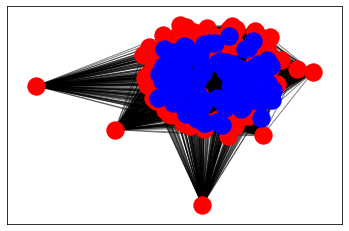

In [129]:
layout = nx.spring_layout(weight_proj_B)
commB=louvain_communities(weight_proj_B, weight='weight')
# 1st community
nx.draw_networkx_nodes(weight_proj_B, layout, nodelist=commB[0],
                       node_color='r')
# 2nd community
nx.draw_networkx_nodes(weight_proj_B, layout, nodelist=commB[1],
                       node_color='b')

# draw edges
nx.draw_networkx_edges(weight_proj_B, layout, width=1.0, alpha=0.5)

In [173]:
 ### read in nextworks from Q3
common_industry_df = pd.DataFrame(weight_proj_B.edges(data=True), columns = ['country_1', 'country_2','common_industry'])
common_industry_df["common_industry"] = common_industry_df['common_industry'].map(lambda x: x['weight'])
sorted_comm_ind_df = common_industry_df.sort_values(by='common_industry', ascending=False)
sorted_comm_ind_df.head(n=10)


,country_1,country_2,common_industry
15252,CHN,USA,24
3924,AUS,USA,24
3864,AUS,CHN,24
17041,ROU,HUN,23
21580,DEU,FRA,23
1091,GRC,RUS,23
1044,GRC,AUS,23
17150,IND,USA,23
11691,RUS,DEU,23
21427,ITA,FRA,23


In [175]:
weighted_deg=G.degree(nbunch=comm[0], weight='weight')


In [176]:
w_series=pd.Series(dict(weighted_deg))


In [178]:
WDegNx=w_series.to_frame(name="weight_deg")
WDegNx.to_csv('../csv/weight_comm0.csv')
WDegNx.sort_values(by="weight_deg", ascending=False).head(n=10)


,weight_deg
SEA,685590.352351
AIR,617763.229300
UGA,88331.476874
TZA,88201.920455
COD,86300.939001
KEN,80197.988156
SDN,65949.634593
NPL,64979.119828
AGO,51343.735532
KHM,50623.688648


In [181]:
weighted_deg=G.degree(nbunch=comm[1], weight='weight')
w_series=pd.Series(dict(weighted_deg))
WDegNx=w_series.to_frame(name="weight_deg")
WDegNx.to_csv('../csv/weight_comm1.csv')
WDegNx.sort_values(by="weight_deg", ascending=False).head(n=10)


,weight_deg
CHN,1.238974e+07
USA,5.647252e+06
IND,3.645444e+06
RUS,1.917831e+06
BRA,1.258196e+06
JPN,1.196839e+06
IDN,9.005617e+05
DEU,8.108095e+05
CAN,6.893210e+05
IRN,6.720336e+05


In [14]:
import matplotlib.pyplot as plt
# rename Unnamed: 0
df1 = pd.read_csv('../csv/weight_comm0.csv')
df2 = pd.read_csv('../csv/weight_comm1.csv')

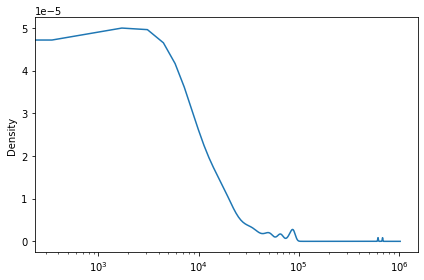

In [15]:
plt.rcParams["figure.figsize"] = [7, 7]
plt.rcParams["figure.autolayout"] = True

fig, ax = plt.subplots()
df1['weight_deg'].plot( kind='kde', ax=ax, logx=True, bw_method=0.05)

plt.show()

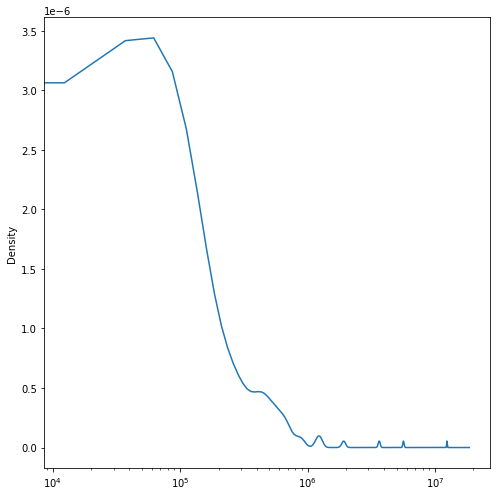

In [16]:
plt.rcParams["figure.figsize"] = [7, 7]
plt.rcParams["figure.autolayout"] = True

fig, ax = plt.subplots()
df2['weight_deg'].plot( kind='kde', ax=ax, logx=True, bw_method=0.05)

plt.show()

It can be noticed that the Louvain algorithm splitted the network in 2 communities, one composed by countries with a higher weighted degree, meaning a most central role in emissions, and the other composed by countries with a lower weighted degree, meaning a lower impact on CO2 emissions.